# Project 01: one protein against many ligands 

The purpose is to find interaction hotspots in a single target through the analysis of interactions found in a dataset of diverse small compounds.

This was used in the prototype pipeline to elucidate hotspots in the sars-cov-19 protease, and we will refine it here against other datasets.

The workflow itself consists of three steps:

1. Obtaining and sanitizing the data
2. Ingesting it in `plipify`
3. Generating publication-worthy figures

In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
from pathlib import Path

HERE = Path(_dh[-1])
DATA = HERE / "data"
OUT = HERE / "output"
DATA.mkdir(exist_ok=True, parents=True)
OUT.mkdir(exist_ok=True, parents=True)

## Obtaining and sanitizing the data

We will be using data from [Diamond](https://www.diamond.ac.uk/), a XRC platform that generates structures for ligand collections against a given target. Back in early 2020, [this dataset](https://www.diamond.ac.uk/covid-19/for-scientists/Main-protease-structure-and-XChem.html) was released to help understand the CoViD-19 infection mechanism. An Excel file is available online, and will serve as a first introduction to the small compound library used.

,Dataset,Library Name,Compound SMILES,Modified Compound SMILES,Compound ID,Site,Confidence Annotation,Resolution (A),Occupancy estimate,Z-Peak,PDB Status,PDB Entry,Fragalysis,Zenodo Status,ROMol
0,Mpro-x0072,DSIpoised_DMSO,CS(=O)(=O)NCCC=1C=CC=CC1,NaN,Z45617795,A - active,4 - High Confidence,1.65,0.40,5.37,Deposited,5R7Y,online,Deposited,
1,Mpro-x0104,DSIpoised_DMSO,CC(=O)NCCC1=CNC=2C=CC(F)=CC12,NaN,Z1220452176,A - active,"2 - Correct ligand, weak density",1.59,0.78,6.47,Deposited,5R7Z,online,Deposited,
2,Mpro-x0107,DSIpoised_DMSO,CC(=O)NC=1C=NC=CC1C,NaN,Z1129283193,A - active,4 - High Confidence,1.88,0.36,5.47,Deposited,5RE4,online,Deposited,
3,Mpro-x0161,DSIpoised_DMSO,COC(=O)C=1C=CC(=CC1)S(=O)(=O)N,NaN,Z18197050,A - active,4 - High confidence,1.93,0.86,11.98,Deposited,5R80,online,Deposited,
4,Mpro-x0165,DSIpoised_DMSO,CN1CCN(CC1)C(=O)NC=2C=CC=CC2,NaN,Z2856434890,X - xtal contact (S81),"2 - Correct ligand, weak density",2.26,0.38,6.87,Deposited,5RGG,online,NaN,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,Mpro-x1493,Cysteine Covalent Library (Weizmann Institute),CC(=O)N1CCN(CC1)C(=O)CCl,CC(=O)N1CCN(CC1)C(=O)C,PCM-0102535,B - active - covalent,4 - High Confidence,1.72,0.33,5.46,Deposited,5RG0,online,Deposited,
91,Mpro-x2052,Cysteine Covalent Library (Weizmann Institute),O=C(C1CCN(C(CCl)=O)CC1)NC2=CC=C(OC)N=C2,COC1=CC=C(NC(=O)C2CCN(CC2)C(C)=O)C=N1,PG-COV-42,B - active - covalent,"2 - Correct ligand, weak density",1.56,0.38,4.82,Deposited,5RHE,online,NaN,
92,Mpro-x2097,Electrophilic Heterocycles (Gyorgy Keseru),N#CC1=NC=CC=N1,N=CC1=NC=CC=N1,Cov_HetLib 030,B - active - covalent,4 - High Confidence,1.43,0.80,6.22,Deposited,5RHB,online,NaN,
93,Mpro-x2119,Electrophilic Heterocycles (Gyorgy Keseru),N#CC1=NC=CN1,N=CC1=NC=CN1,Cov_HetLib 053,B - active - covalent,4 - High Confidence,1.58,0.80,6.26,Deposited,5RHC,online,NaN,

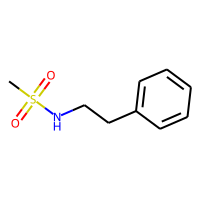
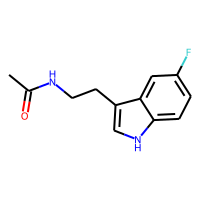
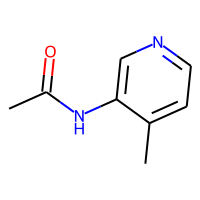
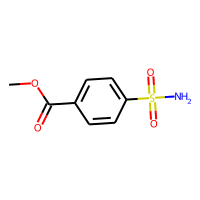
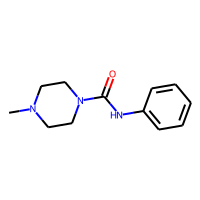
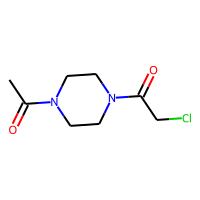
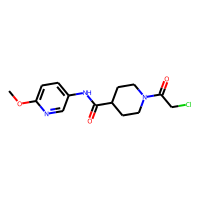
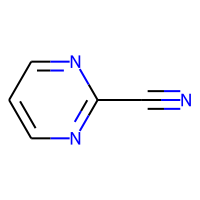
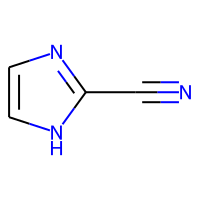
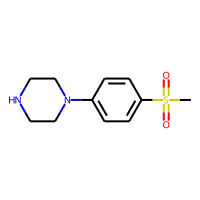

In [3]:
import pandas as pd
from rdkit.Chem.PandasTools import AddMoleculeColumnToFrame

df = pd.read_excel("https://www.diamond.ac.uk/dam/jcr:cb44b3b1-fb14-4376-b172-ce45cbd66b48/Mpro%20full%20XChem%20screen%20-%20hits%20summary%20-%20ver-2020-06-12.xlsx")
AddMoleculeColumnToFrame(df, smilesCol="Compound SMILES")
df

Structural data is available through these links:

* [All Fragment Screen Hits](https://www.diamond.ac.uk/dam/jcr:4c19c5bc-d35b-4e50-8e7d-c7b9ad1515d7/Mpro_XChem_PDB_20200612.7z)
* [Non-covalent fragment hits in the active site](https://www.diamond.ac.uk/dam/jcr:b65e692d-68c9-4344-80ec-67686d775fe8/Mpro_XChem_screen_active_site_11-May-2020.zip)
* [Covalently-bound fragment hits in the active site](https://www.diamond.ac.uk/dam/jcr:8cb74d26-2bf9-4ba1-9c03-4b1f2a343357/Mpro_XChem_screen_covalents_16-May-2020.zip)
* [All other fragment hits including the dimer interface, on the surface, and in crystal contacts](https://www.diamond.ac.uk/dam/jcr:67b33ee1-26b0-43fb-b8e0-ec68e5030e35/Mpro_XChem_screen_other_11-May-2020.zip)

We are interested in the subset that consists of non-covalent ligands:

In [4]:
from urllib.request import urlopen
from io import BytesIO
from zipfile import ZipFile

# If already downloaded, they should be here:
pdbs = list((DATA / "Mpro_XChem_screen_active_site_11-May-2020").glob("*.pdb"))

if not pdbs:
    url = "https://www.diamond.ac.uk/dam/jcr:b65e692d-68c9-4344-80ec-67686d775fe8/Mpro_XChem_screen_active_site_11-May-2020.zip"
    with urlopen(url) as f:
        with BytesIO(f.read()) as b, ZipFile(b) as z:
            z.extractall(DATA)
    # Reassign now
    pdbs = list((DATA / "Mpro_XChem_screen_active_site_11-May-2020").glob("*.pdb"))
    assert pdbs, "Couldn't find downloaded PDB structures!"

In [5]:
import nglview as nv
from time import sleep

view = nv.NGLWidget()
for pdb in pdbs:
    structure = nv.adaptor.FileStructure(str(pdb))
    view.add_component(structure)
view

NGLWidget()

In [6]:
view.render_image(factor=1, trim=True, transparent=True, antialias=True);

In [7]:
view._display_image()

As depicted above, the proteins are prealigned and ligands occupy the same binding site (symetrically duplicated).

## Ingesting it in `plipify` 

TBD.

In [8]:
from plipify.core import Structure
from plipify.fingerprints import InteractionFingerprint
from tqdm.auto import tqdm

In [9]:
structures = [Structure.from_pdbfile(str(path), ligand_identifier="LIG") for path in tqdm(pdbs)]

In [10]:
indices = list(range(20, 193))
fp = InteractionFingerprint(indices).calculate_fingerprint(
        structures,
        labeled=True, 
        as_dataframe=True, 
        remove_non_interacting_residues=True
    )
fp

,hydrophobic,hbond,waterbridge,saltbridge,pistacking,pication,halogen,metal
THR:25.A,3,0,0,0,0,0,0,0
HIS:41.A,2,3,0,0,6,0,0,0
CYS:44.A,0,1,0,0,0,0,0,0
MET:49.A,1,0,0,0,0,0,0,0
PHE:140.A,1,0,0,0,0,0,0,0
ASN:142.A,1,1,1,0,0,0,0,0
GLY:143.A,0,1,0,0,0,0,0,0
SER:144.A,0,3,0,0,0,0,0,0
CYS:145.A,0,1,0,0,0,0,0,0
HIS:163.A,0,2,0,0,0,0,0,0


In [11]:
from plipify.visualization import fingerprint_barplot, fingerprint_heatmap, fingerprint_table

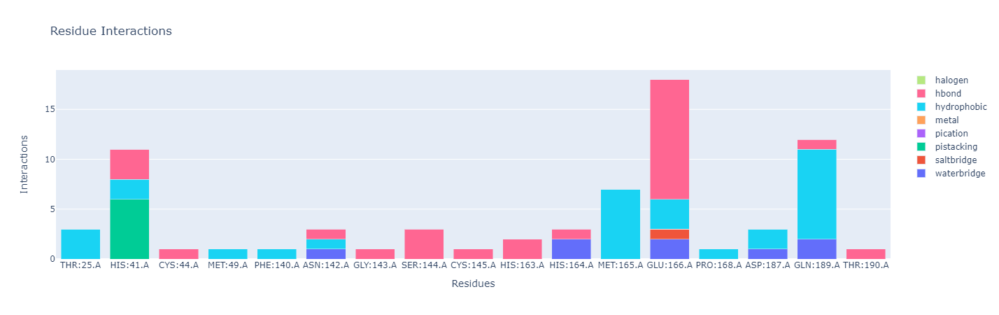

In [12]:
fingerprint_barplot(fp)

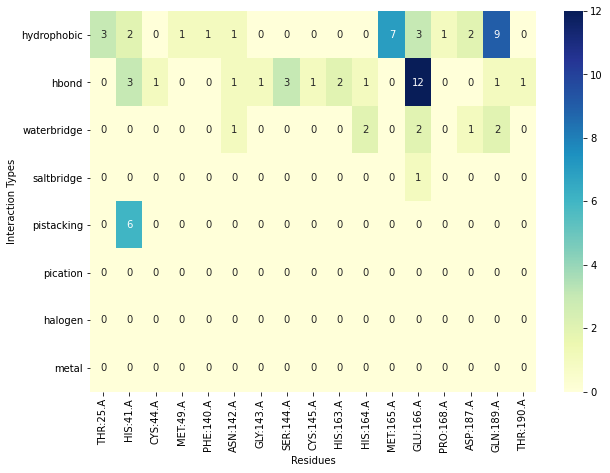

In [13]:
fingerprint_heatmap(fp);

In [14]:
fingerprint_table(fp)

HTML(value='\n    <style>\n    \n    table.plipify-legend {\n        text-align: center;\n        color: #fff;…

## Generating publication-worthy figures

TBD.